# Advanced Regression

In [1]:
# import required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import pandas_profiling
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, make_scorer
from sklearn.linear_model import LinearRegression, RidgeCV, Ridge, LassoCV, Lasso
from sklearn.feature_selection import RFE
from scipy.stats import skew
from scipy.stats import boxcox

import warnings
warnings.filterwarnings('ignore')

## Contents
***
I. <a href='#I'>**Data Understanding**</a>

II. <a href='#II'>**Data Preparation and EDA**</a>

III. <a href='#III'>**Spliting dataset and Scaling**</a>

IV. <a href='#IV'>**Model Building**</a>

V. <a href='#V'>**Business Insight**</a>
*****

## I. Data Understanding<a id='I'></a>

In [2]:
# imoport data into a dataframe
data = pd.read_csv('train.csv')

In [3]:
# lets have a priliminary look at the dataset using pandas profiling library
data.profile_report()

#### Initial thoughts about dataset

1. This dataset consist of 1460 observations and 81 variables out of which 32 seems numeric, 48 categorical and 1 boolean.
2. It consist of missing data in various variables and none of the observation is duplicate(1460 distinct Ids).
3. From the histograms of each variable, it is evident that there are outliers present in the dataset.
4. In 'Correlations' section, we can notice that few variables have high positive and negative correlations amongst them.
5. The scale of variables vary widely and hence it requires Standardization.
6. Also some of the variables seem highly skewed and may require log transformation.

## II. Data Preparation and EDA<a id='II'></a>

### Set of variables<a id='a'></a>

Variables that are similar in nature or represent similar aspect of the property can be grouped into set and can be analysed set wise.
<hr>
0. Id, SalePrice
<hr>
1. Type (Nominal): Alley, BldgType, CentralAir, Condition1, Condition2, Exterior1st, Exterior2nd, Foundation, GarageType, Heating, HouseStyle, LandContour, LotConfig, MSSubClass, MSZoning, MasVnrType, MiscFeature, Neighborhood, RoofMatl, RoofStyle, SaleCondition, SaleType, Street.
<hr>
2. Grade (Ordinal): BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, BsmtQual, Electrical, ExterCond, ExterQual, Fence, FireplaceQu, Functional, GarageCond, GarageFinish, GarageQual, HeatingQC, KitchenQual, LandSlope, LotShape, OverallCond, OverallQual, PavedDrive, PoolQC, Utilities.
<hr>
3. Count (Discrete): BedroomAbvGr, BsmtFullBath, BsmtHalfBath, Fireplaces, FullBath, GarageCars, GarageYrBlt, HalfBath, KitchenAbvGr, MoSold, TotRmsAbvGrd, YearBuilt, YearRemodAdd, YrSold.
<hr>
4. Area (Continuous): 1stFlrSF, 2ndFlrSF, 3SsnPorch, BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, EnclosedPorch, GarageArea, GrLivArea, LotArea, LotFrontage, LowQualFinSF, MasVnrArea, MiscVal, OpenPorchSF, PoolArea, ScreenPorch, TotalBsmtSF, WoodDeckSF.
<hr>

### 0. Id, SalePrice

In [4]:
# we can drop Id column
data = data.drop('Id', axis=1)
data.shape

(1460, 80)

In [5]:
# lets understand SalePrice
data['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

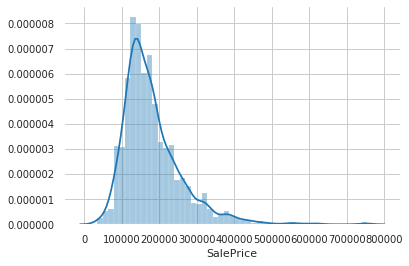

In [6]:
sns.set_style('whitegrid')
sns.distplot(data['SalePrice'])

SalePrice consists of a few huge values which makes the overall SalePrice skewed. To mitigate we will not treat SalePrice for outliers as we have less data and these extreme values may consists of important information. We will rather log transform and standardize the variable.

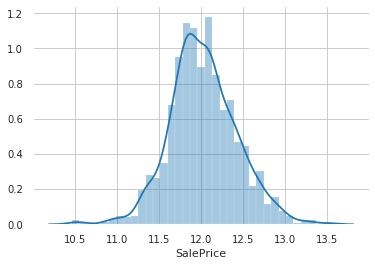

In [7]:
data['SalePrice'] = np.log1p(data['SalePrice'])
sns.set_style('whitegrid')
sns.distplot(data['SalePrice'])

As we can see after log transformation the skewness of SalePrice has decreased and also it has become more normally distributed.

In [8]:
# function for ploting categorical features (boxplot and countplot)
def plot_cat(col_list):
    sns.set_style('whitegrid')    
    for col in col_list:
        plt.figure(figsize=(15,4))

        plt.subplot(121)
        order = data.groupby(col)['SalePrice'].median().sort_values(ascending=False).index
        ax = sns.boxplot(x=col, y='SalePrice', data=data, order=order)    
        plt.xticks(rotation='vertical')

        plt.subplot(122)
        count = data[col].value_counts(normalize=True)*100
        ax = sns.barplot(x=count.index, y=count, order=count.index)    
        plt.xticks(rotation='vertical')

        plt.show()
        
def plot_num(col_list):
    sns.set_style('whitegrid')
    for col in col_list:
        ax = sns.regplot(x=col, y='SalePrice', data=data)
        plt.xticks(rotation='vertical')
        plt.show()

### 1. Type (Nominal)

In [9]:
# list of 'type' variables
type_list = ['Alley', 'BldgType', 'CentralAir', 'Condition1', 'Condition2', 'Exterior1st', 'Exterior2nd', \
             'Foundation', 'GarageType', 'Heating', 'HouseStyle', 'LandContour', 'LotConfig', 'MSSubClass', \
             'MSZoning', 'MasVnrType', 'MiscFeature', 'Neighborhood', 'RoofMatl', 'RoofStyle', 'SaleCondition', \
             'SaleType', 'Street']

In [10]:
# lets have a look at these variables
data[type_list].head()

,Alley,BldgType,CentralAir,Condition1,Condition2,Exterior1st,Exterior2nd,Foundation,GarageType,Heating,...,MSSubClass,MSZoning,MasVnrType,MiscFeature,Neighborhood,RoofMatl,RoofStyle,SaleCondition,SaleType,Street
0,NaN,1Fam,Y,Norm,Norm,VinylSd,VinylSd,PConc,Attchd,GasA,...,60,RL,BrkFace,NaN,CollgCr,CompShg,Gable,Normal,WD,Pave
1,NaN,1Fam,Y,Feedr,Norm,MetalSd,MetalSd,CBlock,Attchd,GasA,...,20,RL,None,NaN,Veenker,CompShg,Gable,Normal,WD,Pave
2,NaN,1Fam,Y,Norm,Norm,VinylSd,VinylSd,PConc,Attchd,GasA,...,60,RL,BrkFace,NaN,CollgCr,CompShg,Gable,Normal,WD,Pave
3,NaN,1Fam,Y,Norm,Norm,Wd Sdng,Wd Shng,BrkTil,Detchd,GasA,...,70,RL,None,NaN,Crawfor,CompShg,Gable,Abnorml,WD,Pave
4,NaN,1Fam,Y,Norm,Norm,VinylSd,VinylSd,PConc,Attchd,GasA,...,60,RL,BrkFace,NaN,NoRidge,CompShg,Gable,Normal,WD,Pave


In [11]:
# checking info of these variables
data[type_list].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 23 columns):
Alley            91 non-null object
BldgType         1460 non-null object
CentralAir       1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
Exterior1st      1460 non-null object
Exterior2nd      1460 non-null object
Foundation       1460 non-null object
GarageType       1379 non-null object
Heating          1460 non-null object
HouseStyle       1460 non-null object
LandContour      1460 non-null object
LotConfig        1460 non-null object
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
MasVnrType       1452 non-null object
MiscFeature      54 non-null object
Neighborhood     1460 non-null object
RoofMatl         1460 non-null object
RoofStyle        1460 non-null object
SaleCondition    1460 non-null object
SaleType         1460 non-null object
Street           1460 non-null object
dtypes: int64(1), object

#### Converting numeric nominal type variables to string type (preserving nans)

In [12]:
# MSSubClass
data = data.replace({"MSSubClass" : {20 : "SC20", 30 : "SC30", 40 : "SC40", 45 : "SC45", 50 : "SC50",\
                                     60 : "SC60", 70 : "SC70", 75 : "SC75", 80 : "SC80", 85 : "SC85",\
                                     90 : "SC90", 120 : "SC120", 150 : "SC150", 160 : "SC160", 180 : "SC180",\
                                     190 : "SC190"}})

Check data type of each variables again

In [13]:
data[type_list].dtypes.value_counts()

object    23
dtype: int64

#### Treating Missing values

In [14]:
'''BldgType, CentralAir, Condition1, Condition2, Exterior1st, Exterior2nd, Foundation, Heating, HouseStyle, \
LandContour, LotConfig, MSSubClass, MSZoning, MasVnrType, Neighborhood, RoofMatl, RoofStyle, SaleCondition, \
SaleType, Street: no missing values'''

# Alley: data description says NA means "no alley access"
data.loc[:, 'Alley'] = data.loc[:, 'Alley'].fillna('No')

# GarageType: data description says NA for garage features is "no garage"
data.loc[:, 'GarageType'] = data.loc[:, 'GarageType'].fillna('No')

# MasVnrType : data description says NA means "no veneer"
data.loc[:, 'MasVnrType'] = data.loc[:, 'MasVnrType'].fillna('None')

# MiscFeature : data description says NA means "no misc feature"
data.loc[:, 'MiscFeature'] = data.loc[:, 'MiscFeature'].fillna('No')

In [15]:
print('Remaining number of missing values: '+str(data[type_list].isnull().sum().sum()))

Remaining number of missing values: 0


Lets have a look at these variables with respect to target variable i.e. SalePrice

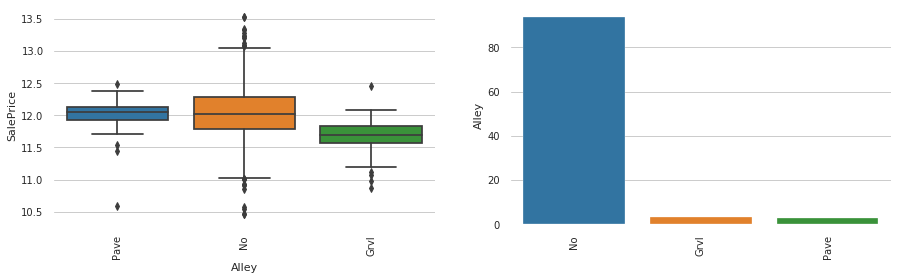

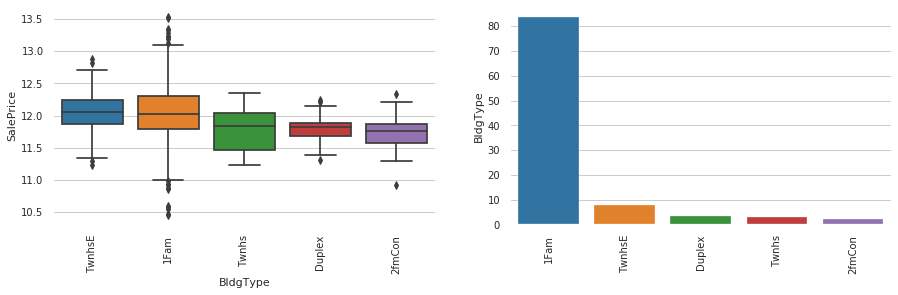

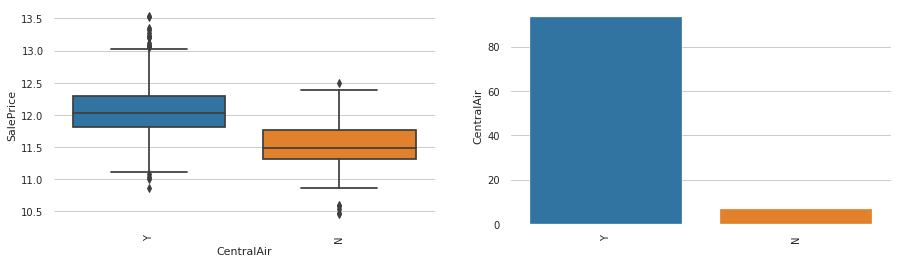

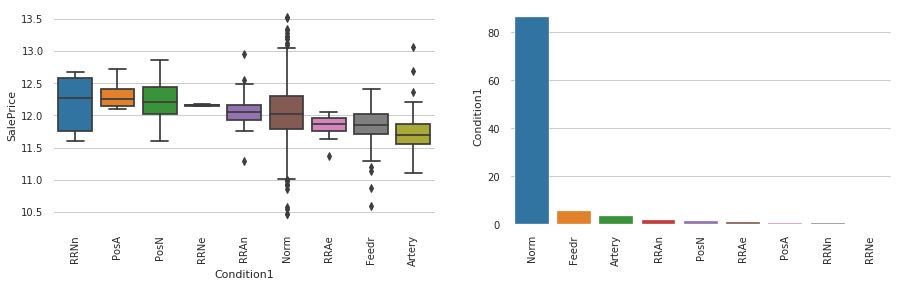

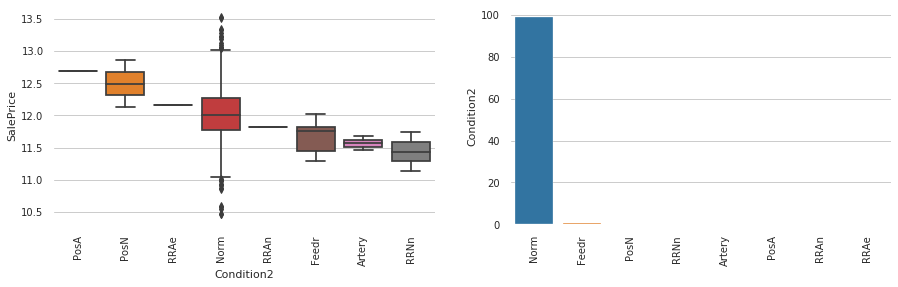

...

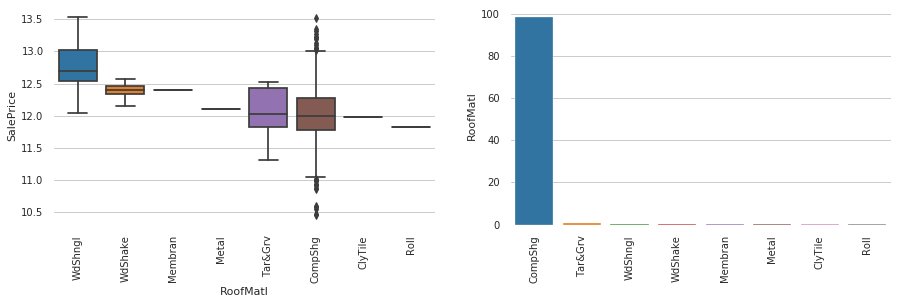

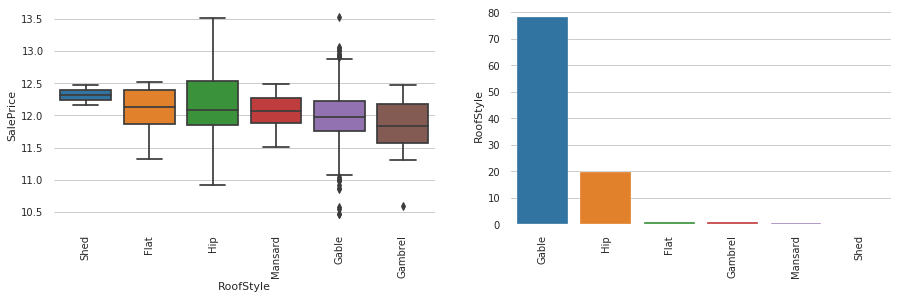

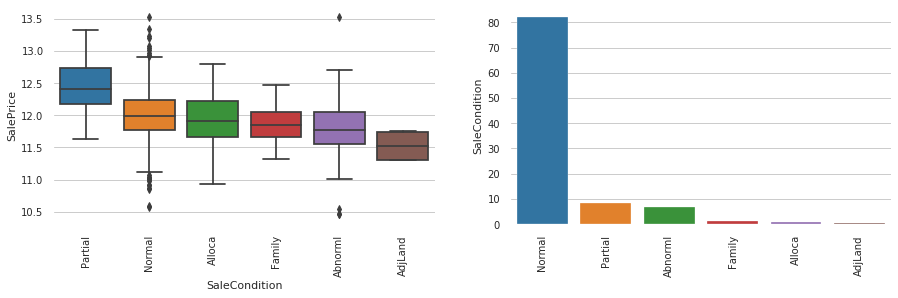

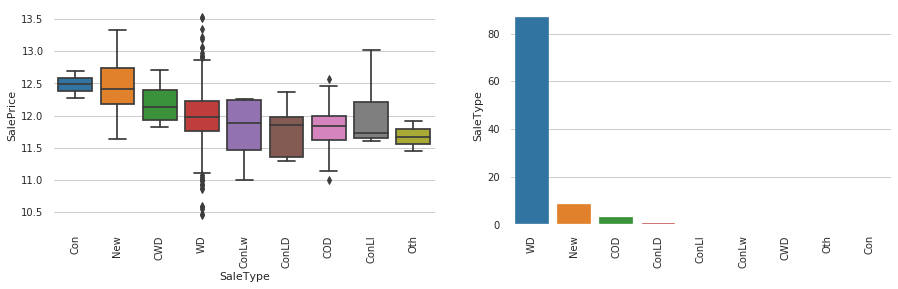

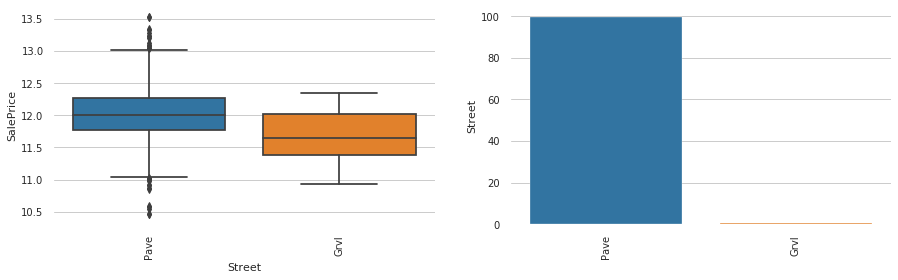

In [16]:
plot_cat(type_list)

Clearly variables such as CentralAir, Condition2, GarageType, MSSubClass, Neighborhood have impact on the target variable and define a trend as the categories amongst the variables changes.

### 2. Grade (Ordinal)

In [17]:
# list of 'grade' variables
grade_list = ['BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtQual', 'Electrical', 'ExterCond', \
              'ExterQual', 'Fence', 'FireplaceQu', 'Functional', 'GarageCond', 'GarageFinish', 'GarageQual', \
              'HeatingQC', 'KitchenQual', 'LandSlope', 'LotShape', 'OverallCond', 'OverallQual', 'PavedDrive', \
              'PoolQC', 'Utilities']

In [18]:
# lets have a look at these variables
data[grade_list].head()

,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtQual,Electrical,ExterCond,ExterQual,Fence,FireplaceQu,...,GarageQual,HeatingQC,KitchenQual,LandSlope,LotShape,OverallCond,OverallQual,PavedDrive,PoolQC,Utilities
0,TA,No,GLQ,Unf,Gd,SBrkr,TA,Gd,NaN,NaN,...,TA,Ex,Gd,Gtl,Reg,5,7,Y,NaN,AllPub
1,TA,Gd,ALQ,Unf,Gd,SBrkr,TA,TA,NaN,TA,...,TA,Ex,TA,Gtl,Reg,8,6,Y,NaN,AllPub
2,TA,Mn,GLQ,Unf,Gd,SBrkr,TA,Gd,NaN,TA,...,TA,Ex,Gd,Gtl,IR1,5,7,Y,NaN,AllPub
3,Gd,No,ALQ,Unf,TA,SBrkr,TA,TA,NaN,Gd,...,TA,Gd,Gd,Gtl,IR1,5,7,Y,NaN,AllPub
4,TA,Av,GLQ,Unf,Gd,SBrkr,TA,Gd,NaN,TA,...,TA,Ex,Gd,Gtl,IR1,5,8,Y,NaN,AllPub


In [19]:
# checking info of these variables
data[grade_list].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 23 columns):
BsmtCond        1423 non-null object
BsmtExposure    1422 non-null object
BsmtFinType1    1423 non-null object
BsmtFinType2    1422 non-null object
BsmtQual        1423 non-null object
Electrical      1459 non-null object
ExterCond       1460 non-null object
ExterQual       1460 non-null object
Fence           281 non-null object
FireplaceQu     770 non-null object
Functional      1460 non-null object
GarageCond      1379 non-null object
GarageFinish    1379 non-null object
GarageQual      1379 non-null object
HeatingQC       1460 non-null object
KitchenQual     1460 non-null object
LandSlope       1460 non-null object
LotShape        1460 non-null object
OverallCond     1460 non-null int64
OverallQual     1460 non-null int64
PavedDrive      1460 non-null object
PoolQC          7 non-null object
Utilities       1460 non-null object
dtypes: int64(2), object(21)
memory usage: 262.5+

#### Treating Missing values

In [20]:
'''ExterCond, ExterQual, Functional, HeatingQC, KitchenQual, LandSlope, LotShape, OverallCond, OverallQual, \
PavedDrive, Utilities: no missing values'''

# BsmtCond: data description says NA for basement features is "no basement"
data.loc[:, 'BsmtCond'] = data.loc[:, 'BsmtCond'].fillna('No')
data.loc[:, 'BsmtExposure'] = data.loc[:, 'BsmtExposure'].fillna('No')
data.loc[:, 'BsmtFinType1'] = data.loc[:, 'BsmtFinType1'].fillna('No')
data.loc[:, 'BsmtFinType2'] = data.loc[:, 'BsmtFinType2'].fillna('No')
data.loc[:, 'BsmtQual'] = data.loc[:, 'BsmtQual'].fillna('No')

# Electrical: define a new category called 'No' where Electrical is NA
data.loc[:, 'Electrical'] = data.loc[:, 'Electrical'].fillna('No')

# Fence: data description says NA means "no fence"
data.loc[:, 'Fence'] = data.loc[:, 'Fence'].fillna('No')

# Fireplace: data description says NA means "no fireplace"
data.loc[:, 'FireplaceQu'] = data.loc[:, 'FireplaceQu'].fillna('No')

# Garage: data description says NA for garage features is "no garage"
data.loc[:, 'GarageCond'] = data.loc[:, 'GarageCond'].fillna('No')
data.loc[:, 'GarageFinish'] = data.loc[:, 'GarageFinish'].fillna('No')
data.loc[:, 'GarageQual'] = data.loc[:, 'GarageQual'].fillna('No')

# PoolQC: data description says NA means "no pool"
data.loc[:, 'PoolQC'] = data.loc[:, 'PoolQC'].fillna('No')

In [21]:
print('Remaining number of missing values: '+str(data[grade_list].isnull().sum().sum()))

Remaining number of missing values: 0


#### Encoding object ordinal type variables to numeric type as there is information in rank (preserving nans)

In [22]:
data = data.replace({  "BsmtCond" : {"No" : 0, "Po" : 1, "Fa" : 2, "TA" : 3, "Gd" : 4, "Ex" : 5},
                       "BsmtExposure" : {"No" : 0, "Mn" : 1, "Av": 2, "Gd" : 3},
                       "BsmtFinType1" : {"No" : 0, "Unf" : 1, "LwQ": 2, "Rec" : 3, "BLQ" : 4, 
                                         "ALQ" : 5, "GLQ" : 6},
                       "BsmtFinType2" : {"No" : 0, "Unf" : 1, "LwQ": 2, "Rec" : 3, "BLQ" : 4, 
                                         "ALQ" : 5, "GLQ" : 6},
                       "BsmtQual" : {"No" : 0, "Po" : 1, "Fa" : 2, "TA": 3, "Gd" : 4, "Ex" : 5},
                       "Electrical" : {"No" : 0, "Mix" : 1, "FuseP" : 2, "FuseF" : 3, "FuseA" : 4, 
                                       "SBrkr" : 5},
                       "ExterCond" : {"Po" : 1, "Fa" : 2, "TA": 3, "Gd": 4, "Ex" : 5},
                       "ExterQual" : {"Po" : 1, "Fa" : 2, "TA": 3, "Gd": 4, "Ex" : 5},
                       "Fence" : {"No" : 0, "MnWw" : 1, "GdWo" : 2, "MnPrv" : 3, "GdPrv" : 4},
                       "FireplaceQu" : {"No" : 0, "Po" : 1, "Fa" : 2, "TA" : 3, "Gd" : 4, "Ex" : 5},
                       "Functional" : {"Sal" : 1, "Sev" : 2, "Maj2" : 3, "Maj1" : 4, "Mod": 5, 
                                       "Min2" : 6, "Min1" : 7, "Typ" : 8},
                       "GarageCond" : {"No" : 0, "Po" : 1, "Fa" : 1, "TA" : 3, "Gd" : 4, "Ex" : 5},
                       "GarageFinish" : {"No" : 0, "Unf" : 1, "RFn" : 2, "Fin" : 3},
                       "GarageQual" : {"No" : 0, "Po" : 1, "Fa" : 2, "TA" : 3, "Gd" : 4, "Ex" : 5},
                       "HeatingQC" : {"Po" : 1, "Fa" : 2, "TA" : 3, "Gd" : 4, "Ex" : 5},
                       "KitchenQual" : {"Po" : 1, "Fa" : 2, "TA" : 3, "Gd" : 4, "Ex" : 5},
                       "LandSlope" : {"Sev" : 1, "Mod" : 2, "Gtl" : 3},
                       "LotShape" : {"IR3" : 1, "IR2" : 2, "IR1" : 3, "Reg" : 4},
                       "PavedDrive" : {"N" : 0, "P" : 1, "Y" : 2},
                       "PoolQC" : {"No" : 0, "Fa" : 1, "TA" : 2, "Gd" : 3, "Ex" : 4},
                       "Utilities" : {"ELO" : 1, "NoSeWa" : 2, "NoSewr" : 3, "AllPub" : 4}}
                 )

Check data type of each variables again

In [23]:
data['BsmtCond'] = data['BsmtCond'].astype('int64')
data[grade_list].dtypes.value_counts()

int64    23
dtype: int64

Lets have a look at these variables with respect to target variable i.e. SalePrice

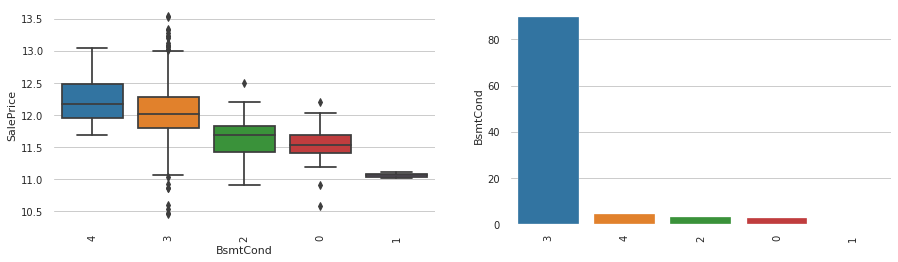

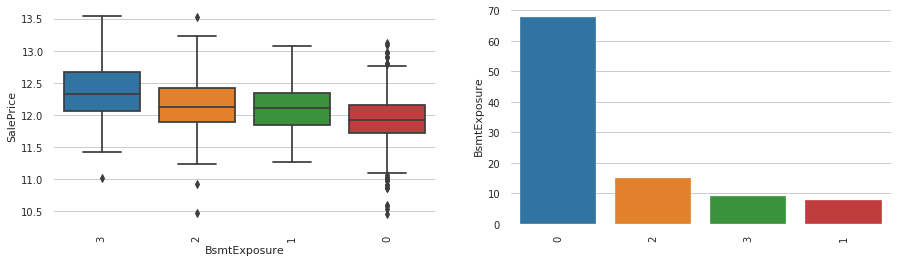

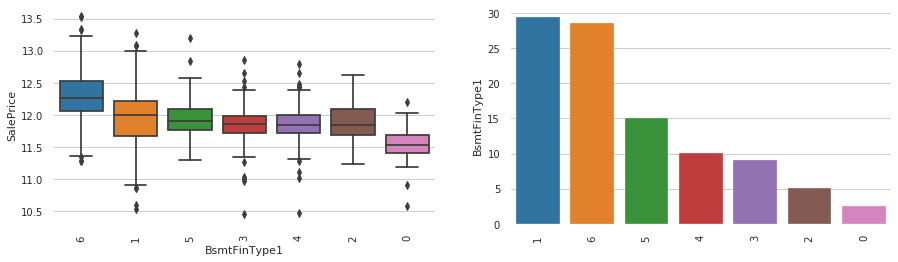

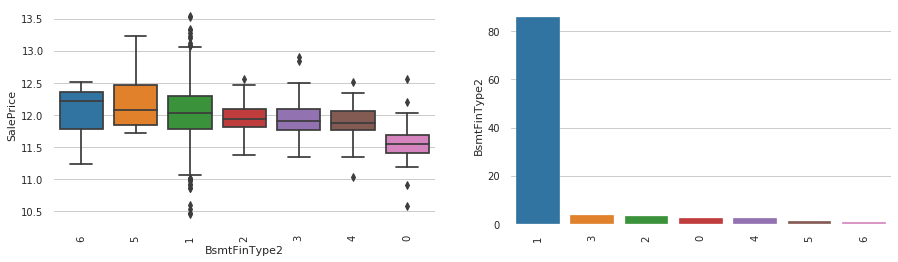

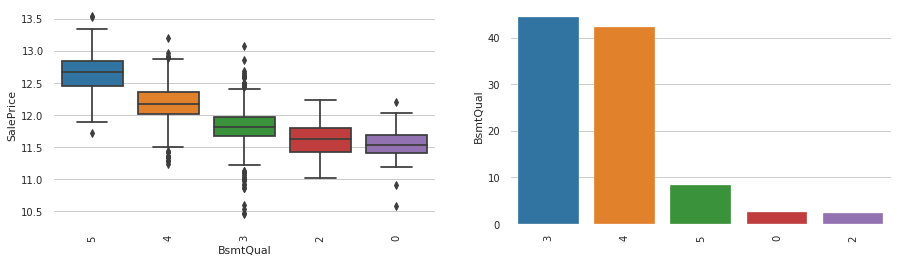

...

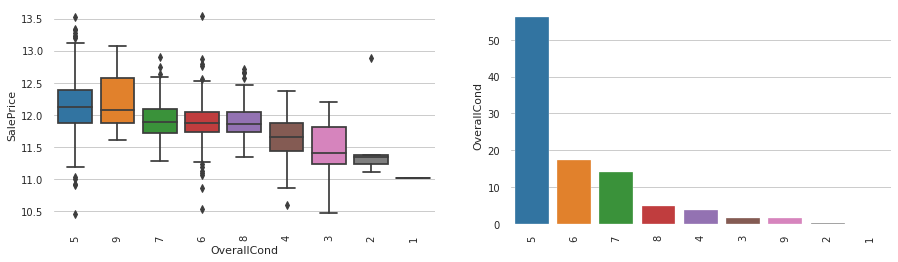

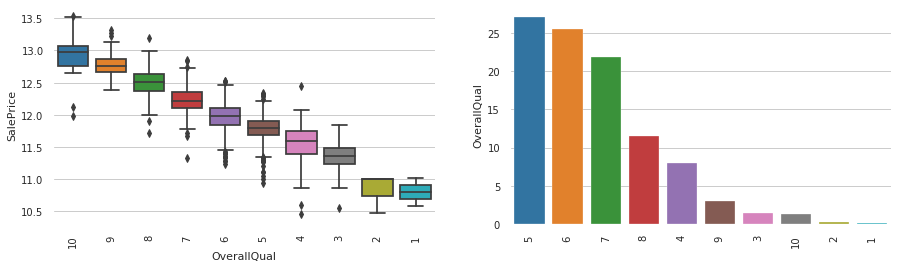

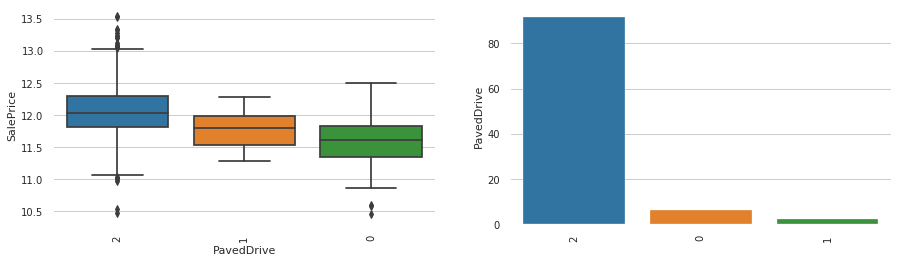

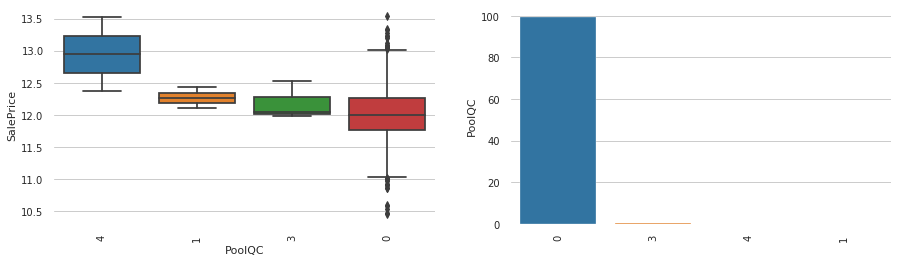

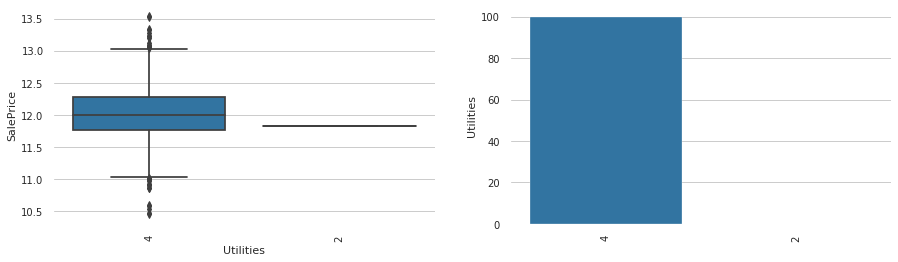

In [24]:
plot_cat(grade_list)

Clearly variables such as BsmtCond, ExterQual, KtchenQual, OverallQual have impact on the target variable and define a trend as the categories amongst the variables changes.

### 3. Count (Discrete)

In [25]:
# list of 'count' variables
count_list = ['BedroomAbvGr', 'BsmtFullBath', 'BsmtHalfBath', 'Fireplaces', 'FullBath', 'GarageCars', \
              'GarageYrBlt', 'HalfBath', 'KitchenAbvGr', 'MoSold', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd', \
              'YrSold']

In [26]:
# lets have a look at these variables
data[count_list].head()

,BedroomAbvGr,BsmtFullBath,BsmtHalfBath,Fireplaces,FullBath,GarageCars,GarageYrBlt,HalfBath,KitchenAbvGr,MoSold,TotRmsAbvGrd,YearBuilt,YearRemodAdd,YrSold
0,3,1,0,0,2,2,2003.0,1,1,2,8,2003,2003,2008
1,3,0,1,1,2,2,1976.0,0,1,5,6,1976,1976,2007
2,3,1,0,1,2,2,2001.0,1,1,9,6,2001,2002,2008
3,3,1,0,1,1,3,1998.0,0,1,2,7,1915,1970,2006
4,4,1,0,1,2,3,2000.0,1,1,12,9,2000,2000,2008


In [27]:
# checking info of these variables
data[count_list].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 14 columns):
BedroomAbvGr    1460 non-null int64
BsmtFullBath    1460 non-null int64
BsmtHalfBath    1460 non-null int64
Fireplaces      1460 non-null int64
FullBath        1460 non-null int64
GarageCars      1460 non-null int64
GarageYrBlt     1379 non-null float64
HalfBath        1460 non-null int64
KitchenAbvGr    1460 non-null int64
MoSold          1460 non-null int64
TotRmsAbvGrd    1460 non-null int64
YearBuilt       1460 non-null int64
YearRemodAdd    1460 non-null int64
YrSold          1460 non-null int64
dtypes: float64(1), int64(13)
memory usage: 159.8 KB


#### Treating Missing values

In [28]:
'''Only GarageYrBlt has missing values'''

# NA in GarageYrBlt indicates garege is missing
data.loc[:, 'GarageYrBlt'] = data.loc[:, 'GarageYrBlt'].fillna(data['GarageYrBlt'].min())

In [29]:
print('Remaining number of missing values: '+str(data[count_list].isnull().sum().sum()))

Remaining number of missing values: 0


#### Convert years column to count of year since earliest year in the data

In [30]:
# converting GarageYrBlt to int
data['GarageYrBlt'] = data['GarageYrBlt'].astype('int64')

convert_year_cols = ['YearBuilt', 'YearRemodAdd', 'YrSold', 'GarageYrBlt']
for col in convert_year_cols:
    data[col] = data[col] - data[col].min()
    
data[convert_year_cols].head()

,YearBuilt,YearRemodAdd,YrSold,GarageYrBlt
0,131,53,2,103
1,104,26,1,76
2,129,52,2,101
3,43,20,0,98
4,128,50,2,100


Lets have a look at these variables with respect to target variable i.e. SalePrice

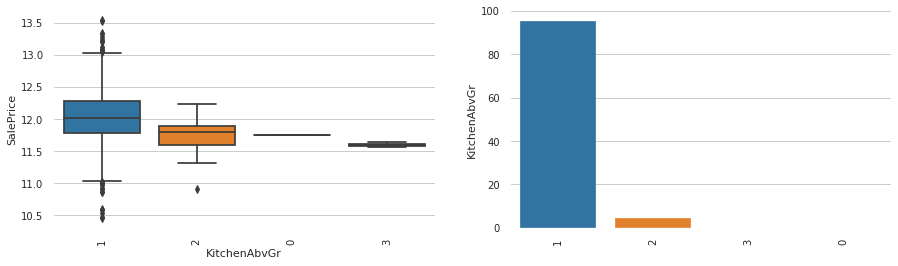

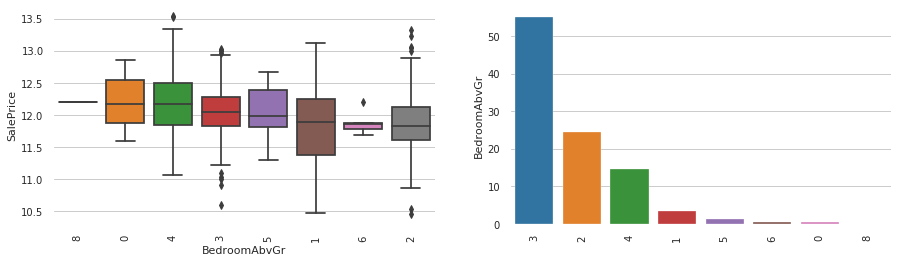

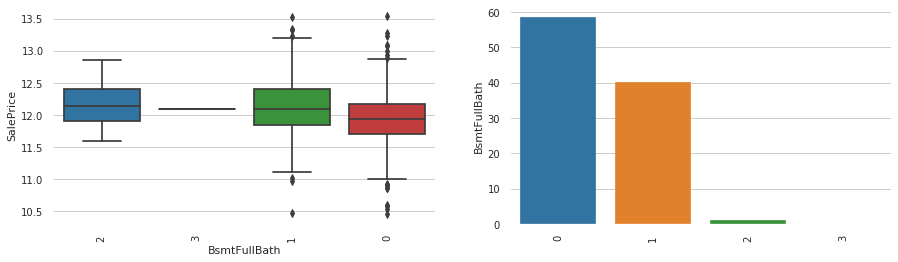

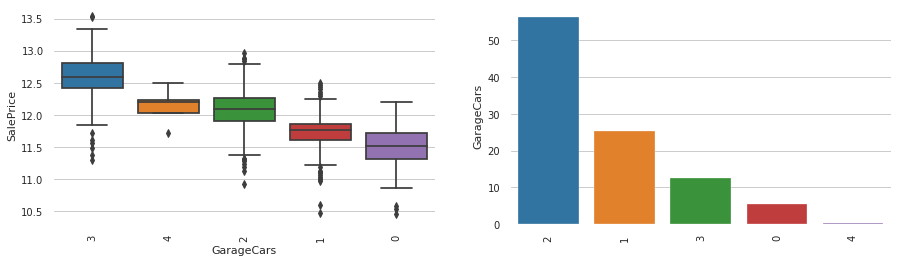

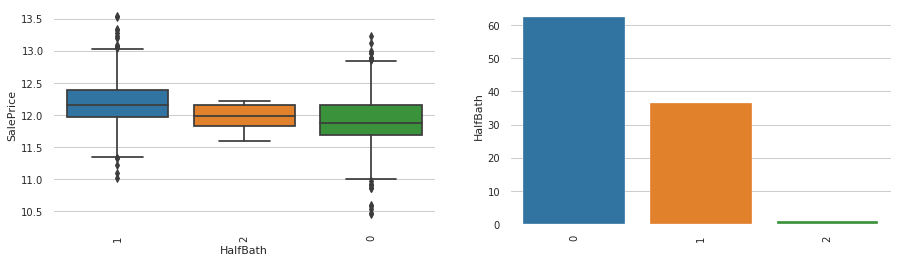

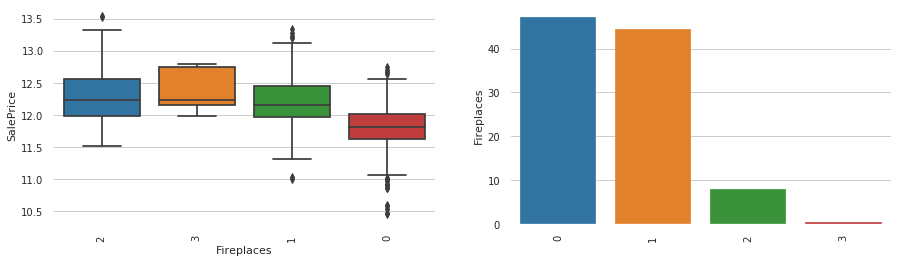

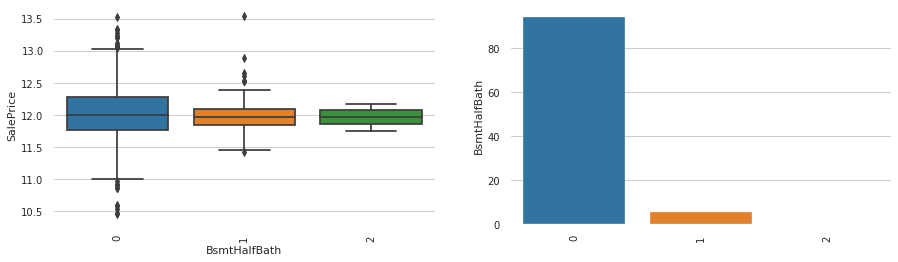

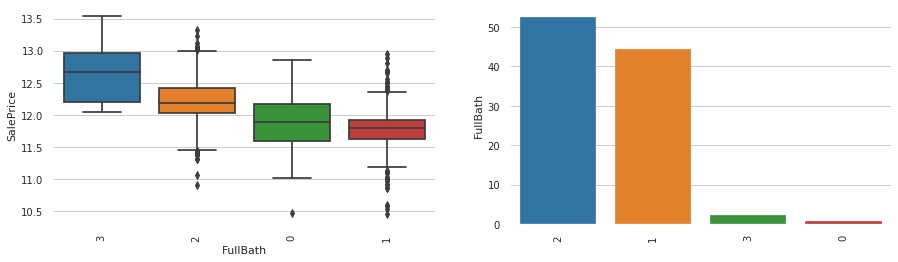

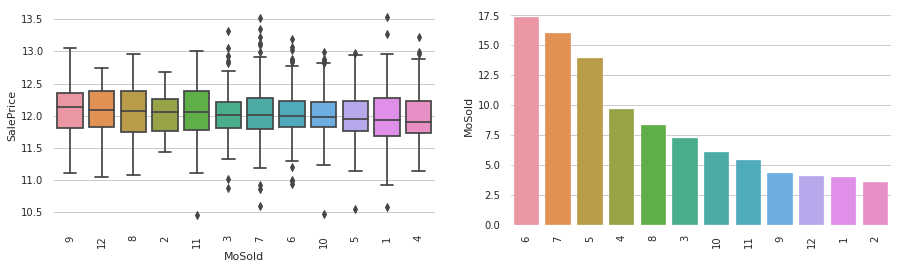

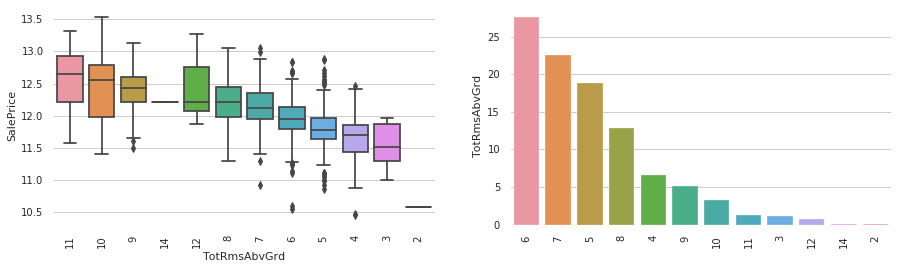

In [31]:
plot_cat(set(count_list) - set(convert_year_cols))

These variables does not seem to have much impact on the target variable.

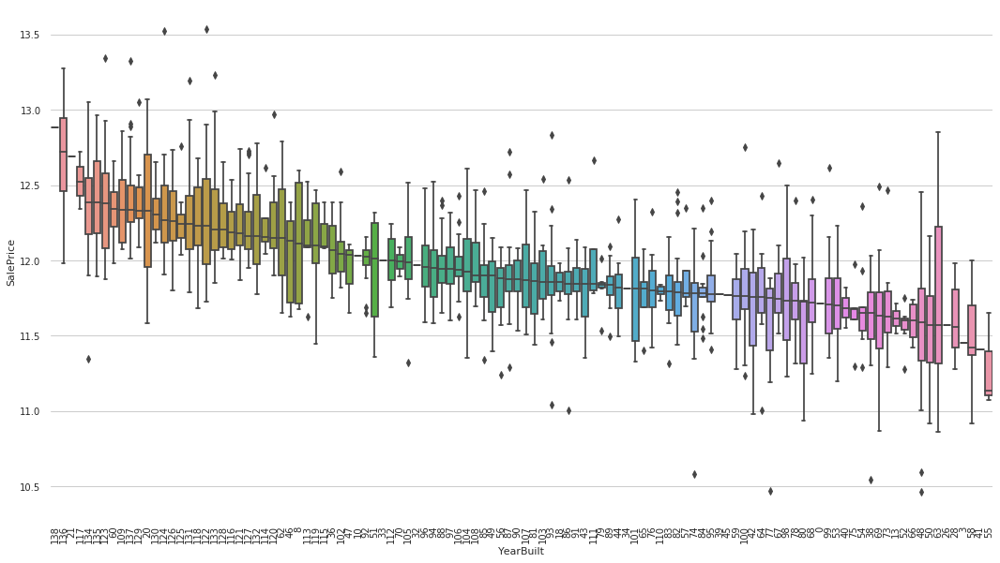

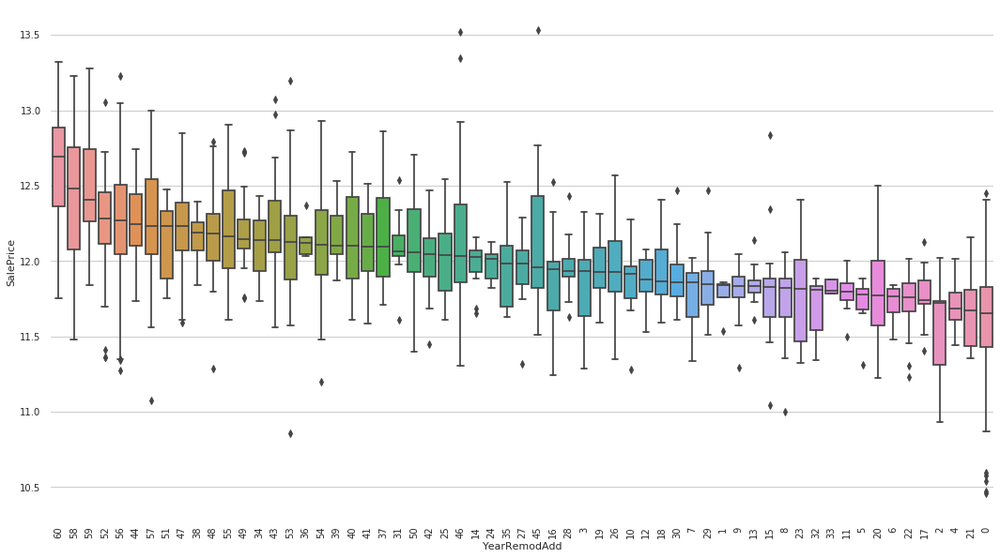

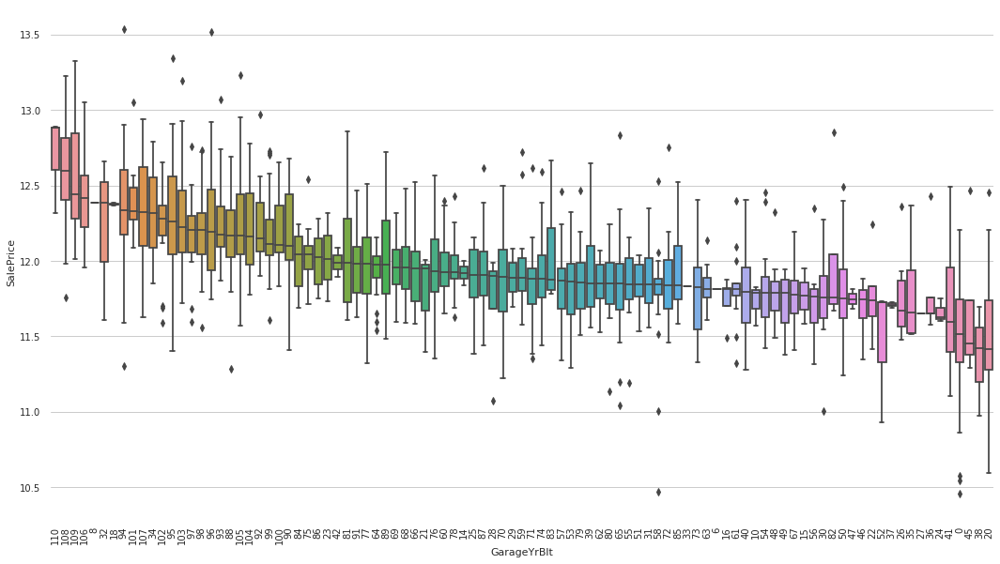

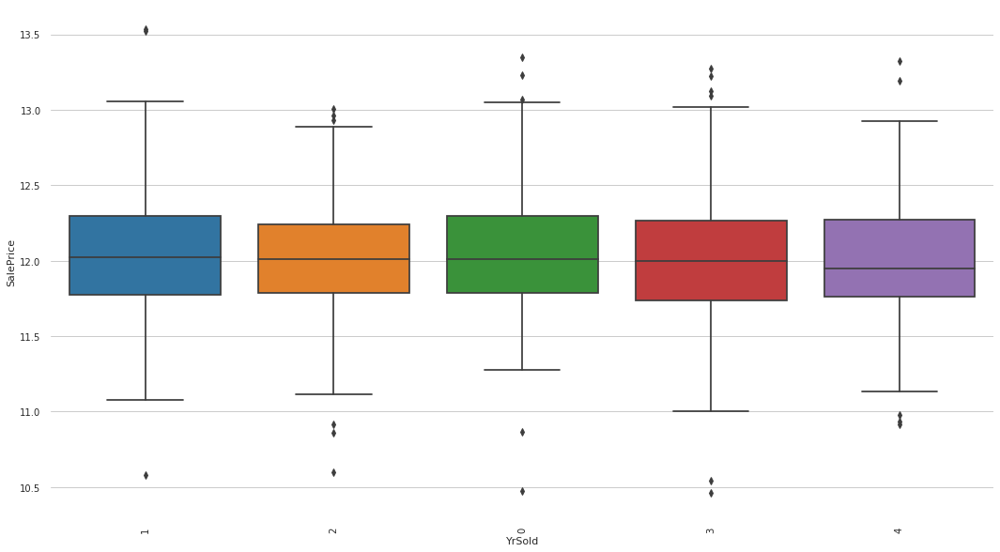

In [32]:
sns.set_style('whitegrid')
for col in set(convert_year_cols):
    order = data.groupby(col)['SalePrice'].median().sort_values(ascending=False).index
    plt.figure(figsize=(18,10))
    ax = sns.boxplot(x=col, y='SalePrice', data=data, order=order)
    plt.xticks(rotation='vertical')
    plt.show()

In [33]:
data[count_list].dtypes.value_counts()

int64    14
dtype: int64

Year of Built, remodelling and garage build have impact on target variable. The later the year of these activities, the higher the price seems to be.

### 4. Area (Continuous)

In [34]:
# list of 'area' variables
area_list = ['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'EnclosedPorch', \
             'GarageArea', 'GrLivArea', 'LotArea', 'LotFrontage', 'LowQualFinSF', 'MasVnrArea', 'MiscVal', \
             'OpenPorchSF', 'PoolArea', 'ScreenPorch', 'TotalBsmtSF', 'WoodDeckSF']

In [35]:
# lets have a look at these variables
data[area_list].head()

,1stFlrSF,2ndFlrSF,3SsnPorch,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,EnclosedPorch,GarageArea,GrLivArea,LotArea,LotFrontage,LowQualFinSF,MasVnrArea,MiscVal,OpenPorchSF,PoolArea,ScreenPorch,TotalBsmtSF,WoodDeckSF
0,856,854,0,706,0,150,0,548,1710,8450,65.0,0,196.0,0,61,0,0,856,0
1,1262,0,0,978,0,284,0,460,1262,9600,80.0,0,0.0,0,0,0,0,1262,298
2,920,866,0,486,0,434,0,608,1786,11250,68.0,0,162.0,0,42,0,0,920,0
3,961,756,0,216,0,540,272,642,1717,9550,60.0,0,0.0,0,35,0,0,756,0
4,1145,1053,0,655,0,490,0,836,2198,14260,84.0,0,350.0,0,84,0,0,1145,192


In [36]:
# checking info of these variables
data[area_list].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 19 columns):
1stFlrSF         1460 non-null int64
2ndFlrSF         1460 non-null int64
3SsnPorch        1460 non-null int64
BsmtFinSF1       1460 non-null int64
BsmtFinSF2       1460 non-null int64
BsmtUnfSF        1460 non-null int64
EnclosedPorch    1460 non-null int64
GarageArea       1460 non-null int64
GrLivArea        1460 non-null int64
LotArea          1460 non-null int64
LotFrontage      1201 non-null float64
LowQualFinSF     1460 non-null int64
MasVnrArea       1452 non-null float64
MiscVal          1460 non-null int64
OpenPorchSF      1460 non-null int64
PoolArea         1460 non-null int64
ScreenPorch      1460 non-null int64
TotalBsmtSF      1460 non-null int64
WoodDeckSF       1460 non-null int64
dtypes: float64(2), int64(17)
memory usage: 216.8 KB


#### Treating Missing values

In [37]:
'''Only LotFrontage and MasVnrArea has missing values'''

# LotFrontage: NA most likely means no lot frontage
data.loc[:, "LotFrontage"] = data.loc[:, "LotFrontage"].fillna(0)

# MasVnrArea: NA most likely means no veneer
data.loc[:, "MasVnrArea"] = data.loc[:, "MasVnrArea"].fillna(0)

In [38]:
print('Remaining number of missing values: '+str(data[area_list].isnull().sum().sum()))

Remaining number of missing values: 0


In [39]:
data[['LotFrontage','MasVnrArea']] = data[['LotFrontage','MasVnrArea']].astype('int64')
data[area_list].dtypes.value_counts()

int64    19
dtype: int64

Lets have a look at these variables with respect to target variable i.e. SalePrice

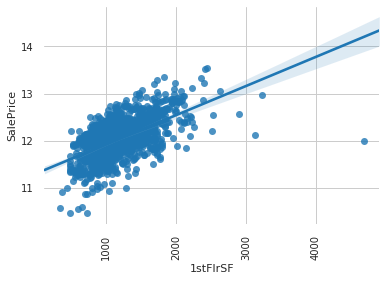

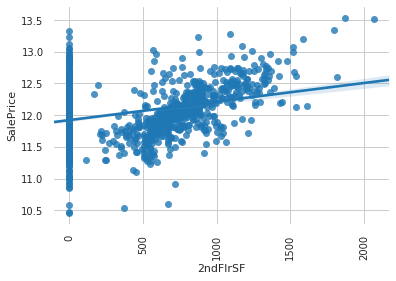

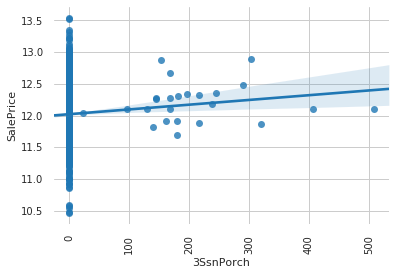

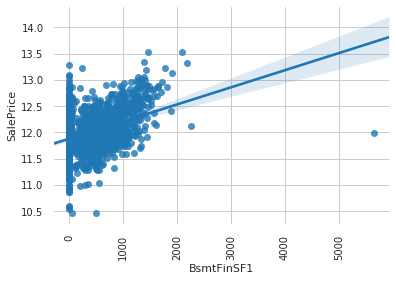

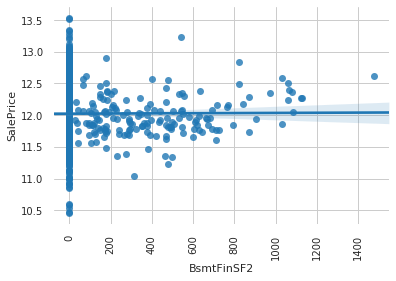

...

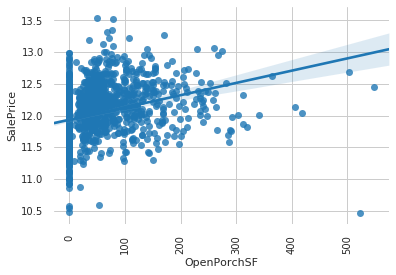

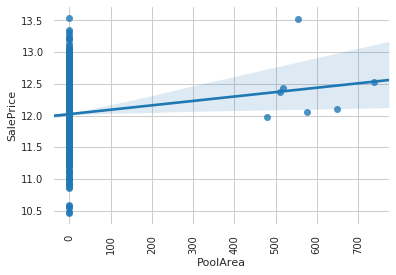

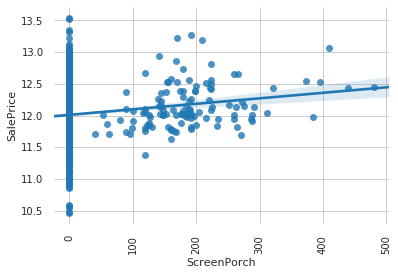

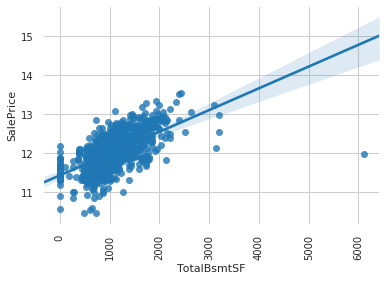

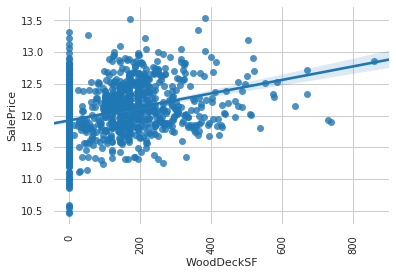

In [40]:
plot_num(area_list)

Lets also have a look at the correlation between variables using heatmap.

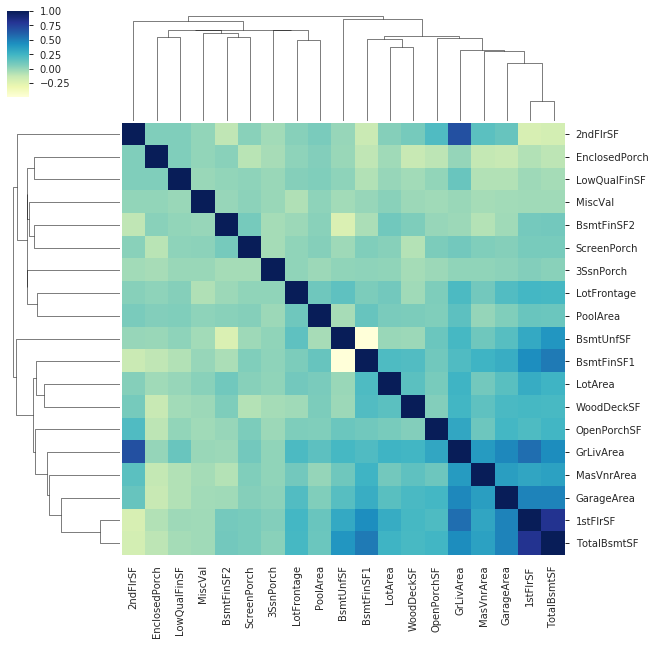

In [41]:
sns.set_style('whitegrid')
ax = sns.clustermap(data[area_list].corr(), cmap='YlGnBu')
plt.show()

Most of the variables are not highly correlated with other variables.

### 5. Derived Variables

#### Simplifications of existing features

In [42]:
old_cols = data.columns

In [43]:
data["SimplOverallQual"] = data.OverallQual.replace({1 : 1, 2 : 1, 3 : 1, # bad
                                                       4 : 2, 5 : 2, 6 : 2, # average
                                                       7 : 3, 8 : 3, 9 : 3, 10 : 3 # good
                                                      })
data["SimplOverallCond"] = data.OverallCond.replace({1 : 1, 2 : 1, 3 : 1, # bad
                                                       4 : 2, 5 : 2, 6 : 2, # average
                                                       7 : 3, 8 : 3, 9 : 3, 10 : 3 # good
                                                      })
data["SimplPoolQC"] = data.PoolQC.replace({1 : 1, 2 : 1, # average
                                             3 : 2, 4 : 2 # good
                                            })
data["SimplGarageCond"] = data.GarageCond.replace({1 : 1, # bad
                                                     2 : 1, 3 : 1, # average
                                                     4 : 2, 5 : 2 # good
                                                    })
data["SimplGarageQual"] = data.GarageQual.replace({1 : 1, # bad
                                                     2 : 1, 3 : 1, # average
                                                     4 : 2, 5 : 2 # good
                                                    })
data["SimplFireplaceQu"] = data.FireplaceQu.replace({1 : 1, # bad
                                                       2 : 1, 3 : 1, # average
                                                       4 : 2, 5 : 2 # good
                                                      })
data["SimplFireplaceQu"] = data.FireplaceQu.replace({1 : 1, # bad
                                                       2 : 1, 3 : 1, # average
                                                       4 : 2, 5 : 2 # good
                                                      })
data["SimplFunctional"] = data.Functional.replace({1 : 1, 2 : 1, # bad
                                                     3 : 2, 4 : 2, # major
                                                     5 : 3, 6 : 3, 7 : 3, # minor
                                                     8 : 4 # typical
                                                    })
data["SimplKitchenQual"] = data.KitchenQual.replace({1 : 1, # bad
                                                       2 : 1, 3 : 1, # average
                                                       4 : 2, 5 : 2 # good
                                                      })
data["SimplHeatingQC"] = data.HeatingQC.replace({1 : 1, # bad
                                                   2 : 1, 3 : 1, # average
                                                   4 : 2, 5 : 2 # good
                                                  })
data["SimplBsmtFinType1"] = data.BsmtFinType1.replace({1 : 1, # unfinished
                                                         2 : 1, 3 : 1, # rec room
                                                         4 : 2, 5 : 2, 6 : 2 # living quarters
                                                        })
data["SimplBsmtFinType2"] = data.BsmtFinType2.replace({1 : 1, # unfinished
                                                         2 : 1, 3 : 1, # rec room
                                                         4 : 2, 5 : 2, 6 : 2 # living quarters
                                                        })
data["SimplBsmtCond"] = data.BsmtCond.replace({1 : 1, # bad
                                                 2 : 1, 3 : 1, # average
                                                 4 : 2, 5 : 2 # good
                                                })
data["SimplBsmtQual"] = data.BsmtQual.replace({1 : 1, # bad
                                                 2 : 1, 3 : 1, # average
                                                 4 : 2, 5 : 2 # good
                                                })
data["SimplExterCond"] = data.ExterCond.replace({1 : 1, # bad
                                                   2 : 1, 3 : 1, # average
                                                   4 : 2, 5 : 2 # good
                                                  })
data["SimplExterQual"] = data.ExterQual.replace({1 : 1, # bad
                                                   2 : 1, 3 : 1, # average
                                                   4 : 2, 5 : 2 # good
                                                  })

#### Combinations of existing features

In [44]:
# Overall quality of the house
data["OverallGrade"] = data["OverallQual"] * data["OverallCond"]
# Overall quality of the garage
data["GarageGrade"] = data["GarageQual"] * data["GarageCond"]
# Overall quality of the exterior
data["ExterGrade"] = data["ExterQual"] * data["ExterCond"]
# Overall kitchen score
data["KitchenScore"] = data["KitchenAbvGr"] * data["KitchenQual"]
# Overall fireplace score
data["FireplaceScore"] = data["Fireplaces"] * data["FireplaceQu"]
# Overall garage score
data["GarageScore"] = data["GarageArea"] * data["GarageQual"]
# Overall pool score
data["PoolScore"] = data["PoolArea"] * data["PoolQC"]
# Simplified overall quality of the house
data["SimplOverallGrade"] = data["SimplOverallQual"] * data["SimplOverallCond"]
# Simplified overall quality of the exterior
data["SimplExterGrade"] = data["SimplExterQual"] * data["SimplExterCond"]
# Simplified overall pool score
data["SimplPoolScore"] = data["PoolArea"] * data["SimplPoolQC"]
# Simplified overall garage score
data["SimplGarageScore"] = data["GarageArea"] * data["SimplGarageQual"]
# Simplified overall fireplace score
data["SimplFireplaceScore"] = data["Fireplaces"] * data["SimplFireplaceQu"]
# Simplified overall kitchen score
data["SimplKitchenScore"] = data["KitchenAbvGr"] * data["SimplKitchenQual"]
# Total number of bathrooms
data["TotalBath"] = data["BsmtFullBath"] + (0.5 * data["BsmtHalfBath"]) + \
data["FullBath"] + (0.5 * data["HalfBath"])
# Total SF for house (incl. basement)
data["AllSF"] = data["GrLivArea"] + data["TotalBsmtSF"]
# Total SF for 1st + 2nd floors
data["AllFlrsSF"] = data["1stFlrSF"] + data["2ndFlrSF"]
# Total SF for porch
data["AllPorchSF"] = data["OpenPorchSF"] + data["EnclosedPorch"] + \
data["3SsnPorch"] + data["ScreenPorch"]
# Has masonry veneer or not
data["HasMasVnr"] = data.MasVnrType.replace({"BrkCmn" : 1, "BrkFace" : 1, "CBlock" : 1, 
                                               "Stone" : 1, "None" : 0})
# House completed before sale or not
data["BoughtOffPlan"] = data.SaleCondition.replace({"Abnorml" : 0, "Alloca" : 0, "AdjLand" : 0, 
                                                      "Family" : 0, "Normal" : 0, "Partial" : 1})

In [45]:
derived_list = list(set(data.columns)-set(old_cols))
len(derived_list)

34

### Create dummy variables

In [46]:
# only nomminal variables need dummy variable creation
data[type_list].dtypes.value_counts()

object    23
dtype: int64

In [47]:
# create dummy data
dummy_data = pd.get_dummies(data[type_list], drop_first=True)
dummy_data.head()

,Alley_No,Alley_Pave,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,CentralAir_Y,Condition1_Feedr,Condition1_Norm,Condition1_PosA,...,SaleCondition_Partial,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,Street_Pave
0,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,1,1
1,1,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,1,1
2,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,1,1
3,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,1,1
4,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,1,1


In [48]:
data.shape

(1460, 114)

In [49]:
# add dummy data to original data
data = pd.concat([data, dummy_data], axis = 1)
data = data.drop(type_list, axis = 1)
type_list = list(dummy_data.columns)
data.shape

(1460, 247)

### Removing variables with high imbalance in data

In [50]:
# creating a dataframe consisting of variables with high imbalance (95% same value)
imbalance_rate = pd.DataFrame()
imbalance_list = []
value_list = []
for col in data.columns:
    value_counts = pd.Series(data[col].value_counts()/len(data)*100)
    imbalance_list.append(list(value_counts)[0])
    value_list.append(list(value_counts.index)[0])

imbalance_rate['Variable'] = data.columns
imbalance_rate['Rate'] = imbalance_list
imbalance_rate['Value'] = value_list
imbalance_rate = imbalance_rate[imbalance_rate['Rate'] > 95].sort_values('Rate', ascending=False).reset_index(drop=True)
imbalance_rate

,Variable,Rate,Value
0,Utilities,99.931507,4.0
1,RoofMatl_Metal,99.931507,0.0
2,Exterior1st_ImStucc,99.931507,0.0
3,Exterior1st_CBlock,99.931507,0.0
4,Exterior1st_AsphShn,99.931507,0.0
...,...,...,...
112,MSSubClass_SC160,95.684932,0.0
113,HouseStyle_SLvl,95.547945,0.0
114,MSZoning_FV,95.547945,0.0
115,KitchenAbvGr,95.342466,1.0


In [51]:
# removing highly imabalanced variables from data
data = data.drop(columns=imbalance_rate['Variable'])
data.shape

(1460, 130)

In [52]:
# removing variables from individual lists
type_list = list(set(type_list)-set(imbalance_rate['Variable']))
grade_list = list(set(grade_list)-set(imbalance_rate['Variable']))
count_list = list(set(count_list)-set(imbalance_rate['Variable']))
area_list = list(set(area_list)-set(imbalance_rate['Variable']))
derived_list = list(set(derived_list)-set(imbalance_rate['Variable']))

In [53]:
print('Total independent variables: {0}'.format(len(type_list+grade_list+count_list+area_list+derived_list)))

Total independent variables: 129


### Treating skewed data using log transformation

As a general rule of thumb, a skewness with an absolute value > 0.5 is considered at least moderately skewed

In [54]:
# find skewed numerical features
skewness = data.apply(lambda x: skew(x))
skewness = skewness[abs(skewness) > 0.5]
print(str(skewness.shape[0]) + " skewed numerical features to log transform")
skewed_features = skewness.index

102 skewed numerical features to log transform


In [55]:
# apply log transformation to skewed features to lessen impact of outliers
data[skewed_features] = np.log1p(data[skewed_features])

In [56]:
# lets have a look at the data after data preparation stage
data.head()

,LotFrontage,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,...,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,RoofStyle_Gable,RoofStyle_Hip,SaleCondition_Normal,SaleCondition_Partial,SaleType_New,SaleType_WD
0,65,9.042040,1.609438,1.386294,7,1.791759,4.882802,3.988984,5.283204,1.609438,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.693147
1,80,9.169623,1.609438,1.386294,6,2.197225,4.653960,3.295837,0.000000,1.386294,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.693147
2,68,9.328212,1.386294,1.386294,7,1.791759,4.867534,3.970292,5.093750,1.609438,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.693147
3,60,9.164401,1.386294,1.386294,7,1.791759,3.784190,3.044522,0.000000,1.386294,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.000000,0.0,0.0,0.693147
4,84,9.565284,1.386294,1.386294,8,1.791759,4.859812,3.931826,5.860786,1.609438,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.693147


## III. Spliting dataset and Scaling<a id='III'></a>

In [57]:
# spliting data into train and test set with train size as 70% of original data
np.random.seed(0)
data_train, data_test = train_test_split(data, train_size = 0.70, random_state = 100)
print('Shape of training data: ' + str(data_train.shape))
print('Shape of testing data: ' + str(data_test.shape))

Shape of training data: (1021, 130)
Shape of testing data: (439, 130)


In [58]:
# create and apply scaler to all the numeric columns and SalePrice
scaler = StandardScaler()

scale_list = grade_list + count_list + area_list + ['SalePrice']
data_train[scale_list] = scaler.fit_transform(data_train[scale_list])

# lets have a look at the data
data_train.head()

,LotFrontage,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,...,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,RoofStyle_Gable,RoofStyle_Hip,SaleCondition_Normal,SaleCondition_Partial,SaleType_New,SaleType_WD
318,0.941631,0.181367,0.647004,-2.987302,0.648310,-0.476987,0.636074,0.502143,1.303917,1.087749,...,0.0,0.000000,0.0,0.0,0.693147,0.000000,0.693147,0.0,0.0,0.693147
239,-0.162998,-0.058320,0.647004,0.220203,-0.066511,-1.579813,-0.587651,-2.354845,-0.807732,-0.698056,...,0.0,0.000000,0.0,0.0,0.693147,0.000000,0.693147,0.0,0.0,0.693147
986,0.040486,-1.017781,0.647004,0.220203,-0.066511,1.975590,-2.155390,0.656759,-0.807732,-0.698056,...,0.0,0.693147,0.0,0.0,0.000000,0.693147,0.693147,0.0,0.0,0.693147
1416,0.069555,0.442793,0.647004,0.220203,-1.496155,0.455440,-4.663035,-2.354845,-0.807732,-0.698056,...,0.0,0.693147,0.0,0.0,0.693147,0.000000,0.693147,0.0,0.0,0.693147
390,-0.221136,-0.133776,0.647004,0.220203,-0.781333,1.975590,-2.880550,-2.354845,-0.807732,-0.698056,...,0.0,0.000000,0.0,0.0,0.693147,0.000000,0.693147,0.0,0.0,0.693147


In [59]:
# seperating independent variaboles(X) and target variable(y) 
y_train = data_train.pop('SalePrice')
X_train = data_train

In [60]:
# applying only transform on test dataset
data_test[scale_list] = scaler.transform(data_test[scale_list])
data_test.head()

,LotFrontage,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,...,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,RoofStyle_Gable,RoofStyle_Hip,SaleCondition_Normal,SaleCondition_Partial,SaleType_New,SaleType_WD
1436,0.069555,-0.002109,0.647004,0.220203,-1.496155,0.455440,0.149354,-0.021169,-0.807732,-0.698056,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.693147
57,0.912562,0.493886,-0.847809,0.220203,0.648310,-0.476987,0.847377,0.670612,-0.807732,1.087749,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.693147
780,0.156763,-0.259158,0.647004,0.220203,0.648310,-0.476987,0.675874,0.551940,0.586402,-0.698056,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.693147
382,0.621870,0.049594,-0.847809,0.220203,0.648310,-0.476987,0.883910,0.697579,-0.807732,1.087749,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.693147
1170,0.534662,0.177474,0.647004,0.220203,-0.066511,0.455440,0.291976,0.160903,-0.807732,-0.698056,...,0.0,0.0,0.0,0.0,0.693147,0.0,0.693147,0.0,0.0,0.693147


In [61]:
# seperating independent variaboles(X) and target variable(y) 
y_test = data_test.pop('SalePrice')
X_test = data_test

## IV. Model Building<a id='IV'></a>

### Define measure for official scoring : R^2 score

In [62]:
# using 10 fold cross validation
scorer = make_scorer(r2_score)

def r2_cv(model, X, y):
    r2= cross_val_score(model, X, y, scoring = scorer, cv = 10)
    return(r2.mean())

#### Plot functions

In [63]:
def plot_res(y_train_pred, y_test_pred, algo):
    plt.scatter(y_train_pred, y_train_pred - y_train, c = "blue", marker = "s", label = "Training data")
    plt.scatter(y_test_pred, y_test_pred - y_test, c = "lightgreen", marker = "s", label = "Validation data")
    plt.title(algo + " Residual plot")
    plt.xlabel("Predicted values")
    plt.ylabel("Residuals")
    plt.legend(loc = "upper left")
    plt.hlines(y = 0, xmin = y_train_pred.min()-1, xmax = y_train_pred.max()+1, color = "red")
    plt.show()
    
def plot_hist(y_train_pred, y_test_pred, algo):
    plt.figure(figsize=(15,5))
    plt.subplot(121)
    plt.title(algo + " Train Residual Histogram")
    res = (y_train_pred - y_train)
    sns.distplot(res, bins = 20)
    plt.xlabel('Train Error')
    
    plt.subplot(122)
    plt.title(algo + " Test Residual Histogram")
    res = (y_test_pred - y_test)
    sns.distplot(res, bins = 20)
    plt.xlabel('Test Error') 
    
def plot_diff(y_train_pred, y_test_pred, algo):
    plt.scatter(y_train_pred, y_train, c = "blue", marker = "s", label = "Training data")
    plt.scatter(y_test_pred, y_test, c = "lightgreen", marker = "s", label = "Validation data")
    plt.title(algo + " Actual vs predicted")
    plt.xlabel("Predicted values")
    plt.ylabel("Real values")
    plt.legend(loc = "upper left")
    pred_max = y_train_pred.max()+1
    pred_min = y_train_pred.min()-1
    plt.plot([pred_min, pred_max], [pred_min, pred_max], c = "red")
    plt.show()
    
def plot_coef(coef,algo):
    coefs = pd.Series(coef, index = X_train.columns)
    print(algo + " picked " + str(sum(coefs != 0)) + " features and eliminated the other " +  \
          str(sum(coefs == 0)) + " features")
    imp_coefs = pd.concat([coefs.sort_values().head(10),
                         coefs.sort_values().tail(10)])
    imp_coefs.plot(kind = "barh")
    plt.title("Coefficients in "+ algo)
    plt.show()

### 1. Unregularised Linear Regression

#### Recurrsive Feature Elimination (RFE)

In unregularised lilnear regression we do not have an inbuild mechanism for feature selection hence we'll use RFE.

In [64]:
# Linear Regression
lr = LinearRegression()
lr.fit(X_train, y_train)

# running RFE
rfe = RFE(lr, 20)             
rfe = rfe.fit(X_train, y_train)

In [65]:
rfe_support = pd.DataFrame({'Variable': X_train.columns,'RFE_Support': rfe.support_,'RFE_ranking': rfe.ranking_})
rfe_support = rfe_support.sort_values('RFE_ranking').reset_index(drop=True)
rfe_support

,Variable,RFE_Support,RFE_ranking
0,Condition1_Norm,True,1
1,Neighborhood_Edwards,True,1
2,MSZoning_RL,True,1
3,SimplOverallQual,True,1
4,SimplOverallCond,True,1
...,...,...,...
124,AllPorchSF,False,106
125,OpenPorchSF,False,107
126,MoSold,False,108
127,BedroomAbvGr,False,109


Lets have a look at the variables that were eliminated by RFE.

In [66]:
# variables that are not supported by RFE
print('Non supported variables: ' + str(list(X_train.columns[~rfe.support_])))

Non supported variables: ['LotFrontage', 'LotArea', 'LotShape', 'LandSlope', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'ExterCond', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'HeatingQC', 'Electrical', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'Fence', 'MoSold', 'YrSold', 'SimplFireplaceQu', 'SimplFunctional', 'SimplKitchenQual', 'SimplHeatingQC', 'SimplBsmtFinType2', 'SimplBsmtCond', 'SimplBsmtQual', 'OverallGrade', 'GarageGrade', 'KitchenScore', 'FireplaceScore', 'GarageScore', 'SimplOverallGrade', 'SimplGarageScore', 'SimplFireplaceScore', 'SimplKitchenScore', 'TotalBath', 'AllFlrsSF',

In [67]:
# keeping only the supported columns
col = X_train.columns[rfe.support_]
X_train_rfe = X_train[col]
X_test_rfe = X_test[col]

In [68]:
# fitting Linear Regression on newly selected columns
lr = LinearRegression()
lr.fit(X_train_rfe, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [69]:
# Look at R^2 score on training and validation set
lr_train_r2 = r2_cv(lr, X_train_rfe, y_train)
lr_test_r2 = r2_cv(lr, X_test_rfe, y_test)
print("Linear regression R^2 score on Training set :", lr_train_r2)
print("Linear regression R^2 score on Test set :", lr_test_r2)

Linear regression R^2 score on Training set : 0.8550188396996934
Linear regression R^2 score on Test set : 0.8244545403760428


In [70]:
# predicting for both train and test set
y_train_lr = lr.predict(X_train_rfe)
y_test_lr = lr.predict(X_test_rfe)

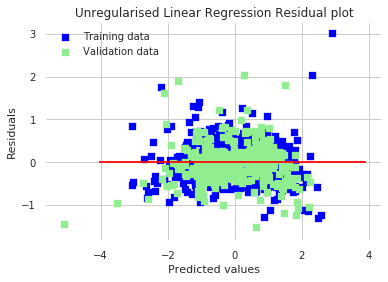

In [71]:
# Plot residual plot
plot_res(y_train_lr, y_test_lr, 'Unregularised Linear Regression')

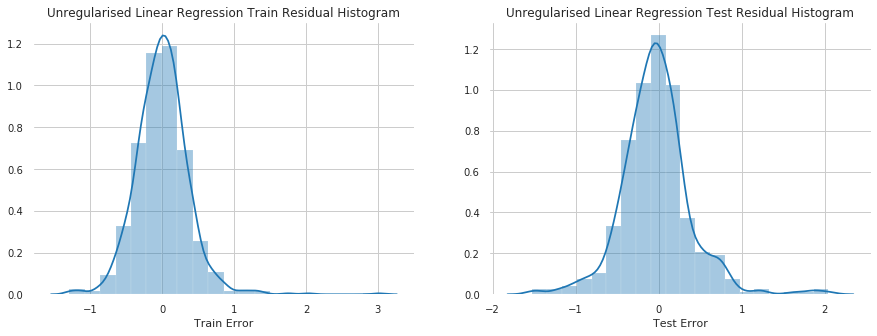

In [72]:
# Plot histogram of residual
plot_hist(y_train_lr, y_test_lr, 'Unregularised Linear Regression')                

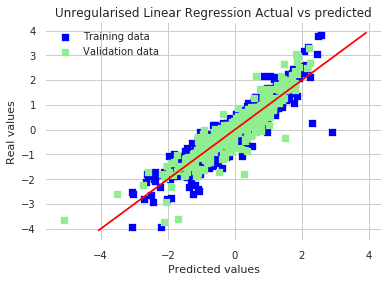

In [73]:
# Plot predictions
plot_diff(y_train_lr, y_test_lr, 'Unregularised Linear Regression')

We can observe the following from the above plots - 
1. Mean of Residuals is zero
2. Scatter of residuals is completely random and also Regression line coincides with y = 0 and hence there is no relation/pattern in the residuals i.e. most of it is explained by our model. ***Error terms are independent of each other.***
3. Spread of residuals is mostly contained between 2 and -2 with a couple of exceptions. This suggests that the ***variance of error terms is constant i.e. homoscedastic***

Now lets use Regularised Linear Regression techniques such as Ridge and Lasso to get even better results in terms of R^2 score and number of parameters used.

### 2. Ridge Linear Regression

#### Determining alpha

In [74]:
# list of alphas to tune
params = {'alpha': np.linspace(0.01,100,100)}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, param_grid = params, scoring= 'neg_mean_absolute_error', cv = folds, 
                        return_train_score=True, verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   10.9s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([1.000e-02, 1.020e+00, 2.030e+00, 3.040e+00, 4.050e+00, 5.060e+00,
       6.070e+00, 7.080e+00, 8.090e+00, 9.100e+00, 1.011e+01, 1.112e+01,...
       7.273e+01, 7.374e+01, 7.475e+01, 7.576e+01, 7.677e+01, 7.778e+01,
       7.879e+01, 7.980e+01, 8.081e+01, 8.182e+01, 8.283e+01, 8.384e+01,
       8.485e+01, 8.586e+01, 8.687e+01, 8.788e+01, 8.889e+01, 8.990e+01,
       9.091e+01, 9.192e+01, 9.293e+01, 9.394e+01, 9.495e+01, 9.596e+01,
       9.697e+01, 9.798e+01, 9.899e+01, 1.000e+02])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_absolute_error', verbose=1)

In [75]:
# lets have a look at the crossvalidation results 
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.009197,0.002887,0.002181,0.000396,0.01,{'alpha': 0.01},-0.213775,-0.237508,-0.237846,-0.219869,...,-0.225635,0.010051,74,-0.191986,-0.177403,-0.181399,-0.192729,-0.193326,-0.187369,0.006641
1,0.006052,0.000383,0.001714,0.000052,1.02,{'alpha': 1.02},-0.211852,-0.232637,-0.236288,-0.209512,...,-0.220775,0.011302,34,-0.193518,-0.178609,-0.183341,-0.194856,-0.193622,-0.188789,0.006570
2,0.011250,0.006836,0.004190,0.002923,2.03,{'alpha': 2.03},-0.211721,-0.231547,-0.235163,-0.206530,...,-0.219612,0.011483,26,-0.194266,-0.179599,-0.184124,-0.195995,-0.194298,-0.189656,0.006553
3,0.009441,0.004357,0.003349,0.001875,3.04,{'alpha': 3.04},-0.211343,-0.230867,-0.234745,-0.204505,...,-0.218837,0.011797,20,-0.194731,-0.180388,-0.184714,-0.196667,-0.194769,-0.190254,0.006474
4,0.018593,0.014455,0.004784,0.002101,4.05,{'alpha': 4.05},-0.210884,-0.230516,-0.234688,-0.203082,...,-0.218305,0.012156,16,-0.195051,-0.181022,-0.185198,-0.197164,-0.195285,-0.190744,0.006413


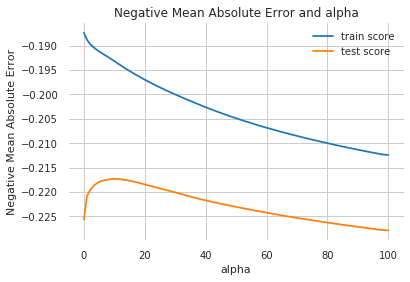

In [76]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int64')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'])
plt.show()

The optimal value of alpha seems to lie between 0 and 20. We will use RidgeCV class from sklearn which has inbuilt mechanism to find the best alpha from a series of alphas. And it also performs cross validation over the given number of folds to find best alpha.

In [77]:
# deducing the best alpha
ridge = RidgeCV(alphas = np.linspace(0.01,100,100), cv=10)
ridge.fit(X_train, y_train)
alpha = ridge.alpha_
print("Best alpha :", alpha)

Best alpha : 12.13


In [78]:
print("Try again for more precision with alphas centered around " + str(alpha))
ridge = RidgeCV(alphas = np.linspace(alpha-1,alpha+1,100), cv = 10)
ridge.fit(X_train, y_train)
alpha = ridge.alpha_
print("Best alpha :", alpha)

Try again for more precision with alphas centered around 12.13
Best alpha : 12.241111111111111


#### Fitting the model using best alpha

In [79]:
# using the best alpha
ridge = Ridge(alpha = alpha)
ridge.fit(X_train,y_train)

Ridge(alpha=12.241111111111111, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

#### Evaluating model performance

In [80]:
# Look at R^2 score on training and validation set
rg_train_r2 = r2_cv(ridge, X_train, y_train)
rg_test_r2 = r2_cv(ridge, X_test, y_test)
print("Ridge R^2 score on Training set :", rg_train_r2)
print("Ridge R^2 score on Test set :", rg_test_r2)

Ridge R^2 score on Training set : 0.8881820817828101
Ridge R^2 score on Test set : 0.880320763045966


In [81]:
# predicting for both train and test set
y_train_rdg = ridge.predict(X_train)
y_test_rdg = ridge.predict(X_test)

#### Ploting evaluation statistics

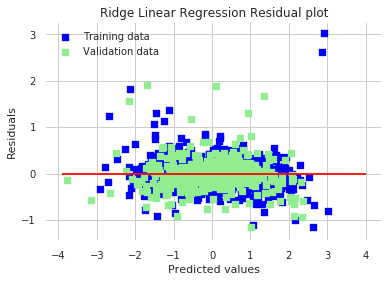

In [82]:
# Plot residual plot
plot_res(y_train_rdg, y_test_rdg, 'Ridge Linear Regression')

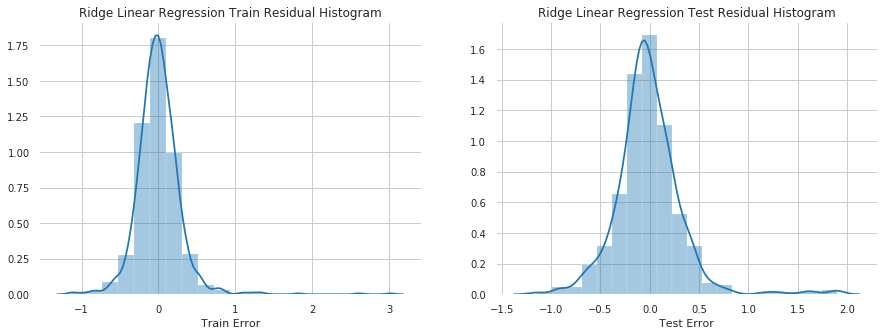

In [83]:
# Plot histogram of residual
plot_hist(y_train_rdg, y_test_rdg, 'Ridge Linear Regression')                

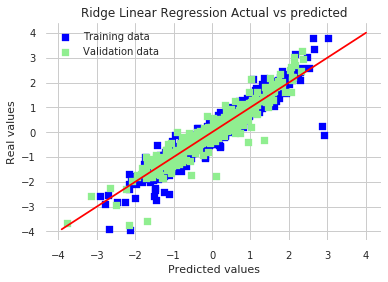

In [84]:
# Plot predictions
plot_diff(y_train_rdg, y_test_rdg, 'Ridge Linear Regression')

Ridge Linear Regression picked 129 features and eliminated the other 0 features


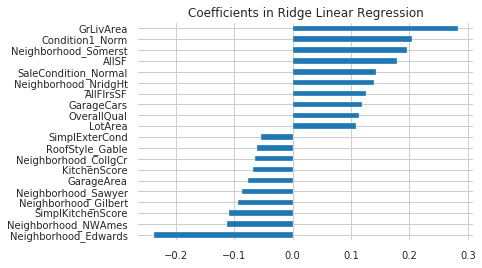

In [85]:
# Plot important coefficients
plot_coef(ridge.coef_, 'Ridge Linear Regression')

### 3. Lasso Linear Regression

Lasso regularization diminishes a lot of variables to 0 in order to reduce model complexity and due to the nature of Lasso regularization. To increase the coefficients while keeping intact the nature of data, we will multiply all values by a large constant. 

In [86]:
X_train_ls = X_train.apply(lambda x: x*10000)
X_test_ls = X_test.apply(lambda x: x*10000)

#### Determining alpha

In [87]:
# list of alphas to tune
params = {'alpha': np.linspace(0.01,100,100)}

lasso = Lasso()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = lasso, param_grid = params, scoring= 'neg_mean_absolute_error', cv = folds, 
                        return_train_score=True, verbose = 1)            
model_cv.fit(X_train_ls, y_train) 

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   23.8s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': array([1.000e-02, 1.020e+00, 2.030e+00, 3.040e+00, 4.050e+00, 5.060e+00,
       6.070...
       7.273e+01, 7.374e+01, 7.475e+01, 7.576e+01, 7.677e+01, 7.778e+01,
       7.879e+01, 7.980e+01, 8.081e+01, 8.182e+01, 8.283e+01, 8.384e+01,
       8.485e+01, 8.586e+01, 8.687e+01, 8.788e+01, 8.889e+01, 8.990e+01,
       9.091e+01, 9.192e+01, 9.293e+01, 9.394e+01, 9.495e+01, 9.596e+01,
       9.697e+01, 9.798e+01, 9.899e+01, 1.000e+02])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_absolute_error', verbose=1)

In [88]:
# lets have a look at the crossvalidation results 
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.122882,0.007210,0.002765,0.000661,0.01,{'alpha': 0.01},-0.212688,-0.237008,-0.237112,-0.218653,...,-0.225022,0.010109,50,-0.192361,-0.177703,-0.181454,-0.193011,-0.193404,-0.187587,0.006654
1,0.141677,0.025369,0.002862,0.000781,1.02,{'alpha': 1.02},-0.211052,-0.235384,-0.237698,-0.214485,...,-0.222696,0.011398,40,-0.192208,-0.177493,-0.181776,-0.192833,-0.192261,-0.187314,0.006419
2,0.124182,0.011449,0.002774,0.000216,2.03,{'alpha': 2.03},-0.210397,-0.233690,-0.236649,-0.210828,...,-0.220782,0.011794,31,-0.192775,-0.178225,-0.181938,-0.193390,-0.192255,-0.187716,0.006354
3,0.143474,0.012314,0.004467,0.003630,3.04,{'alpha': 3.04},-0.209417,-0.233367,-0.235558,-0.209367,...,-0.219816,0.011992,26,-0.193216,-0.178676,-0.182245,-0.193700,-0.192838,-0.188135,0.006373
4,0.143120,0.028027,0.002839,0.000573,4.05,{'alpha': 4.05},-0.209006,-0.232266,-0.234515,-0.207458,...,-0.218913,0.011898,22,-0.193553,-0.179568,-0.183094,-0.194661,-0.193792,-0.188934,0.006318


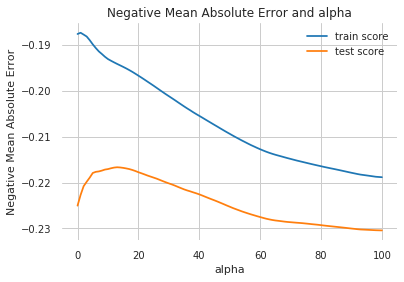

In [89]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'])
plt.show()

The optimal value of alpha seems to lie between 0 and 20. We will use LasoCV class from sklearn which has inbuilt mechanism to find the best alpha from a series of alphas. And it also performs cross validation over the given number of folds to find best alpha.

In [90]:
# deducing the best alpha
lasso = LassoCV(alphas = np.linspace(0.001,100,100), cv=10)
lasso.fit(X_train_ls, y_train)
alpha = lasso.alpha_
print("Best alpha :", alpha)

Best alpha : 14.142272727272728


In [91]:
print("Try again for more precision with alphas centered around " + str(alpha))
lasso = LassoCV(alphas = np.linspace(alpha-1,alpha+1,100), cv = 10)
lasso.fit(X_train_ls, y_train)
alpha = lasso.alpha_
print("Best alpha :", alpha)

Try again for more precision with alphas centered around 14.142272727272728
Best alpha : 13.263484848484849


#### Fitting the model using best alpha

In [92]:
# using the best alpha
lasso = Lasso(alpha = alpha)
lasso.fit(X_train_ls,y_train)

Lasso(alpha=13.263484848484849, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

#### Evaluating model performance

In [93]:
# Look at R^2 score on training and validation set
ls_train_r2 = r2_cv(lasso, X_train_ls, y_train)
ls_test_r2 = r2_cv(lasso, X_test_ls, y_test)
print("Lasso R^2 score on Training set :", ls_train_r2)
print("Lasso R^2 score on Test set :", ls_test_r2)

Lasso R^2 score on Training set : 0.8900976926593656
Lasso R^2 score on Test set : 0.8724092060661389


In [94]:
# predicting for both train and test set
y_train_ls = lasso.predict(X_train_ls)
y_test_ls = lasso.predict(X_test_ls)

#### Ploting evaluation statistics

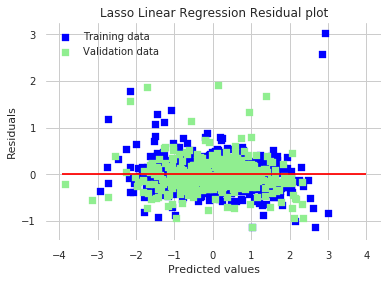

In [95]:
# Plot residual plot
plot_res(y_train_ls, y_test_ls, 'Lasso Linear Regression')

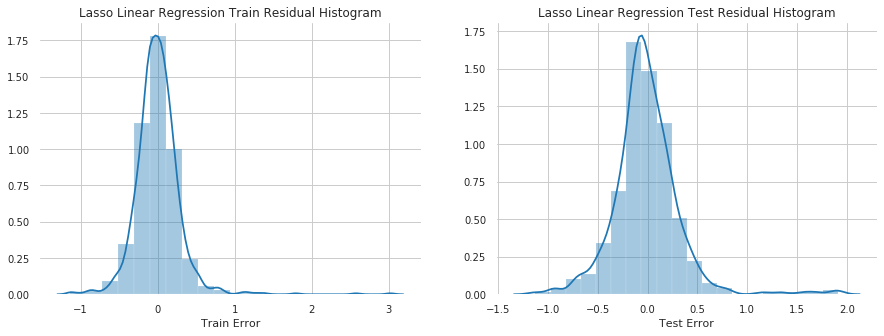

In [96]:
# Plot histogram of residual
plot_hist(y_train_ls, y_test_ls, 'Lasso Linear Regression')                

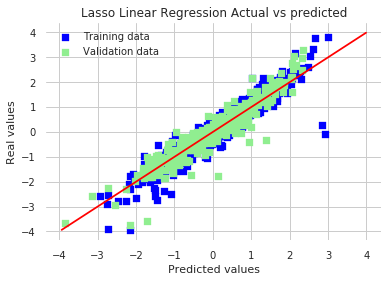

In [97]:
# Plot predictions
plot_diff(y_train_ls, y_test_ls, 'Lasso Linear Regression')

Lasso Linear Regression picked 81 features and eliminated the other 48 features


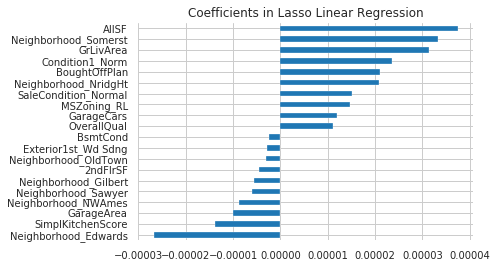

In [98]:
# Plot important coefficients
plot_coef(lasso.coef_, 'Lasso Linear Regression')

## V. Business Insight<a id='V'></a>

R^2 scores of each algorithm for train and test set.

In [99]:
r2_score = pd.DataFrame({'Train Score': [lr_train_r2,rg_train_r2,ls_train_r2], 
                         'Test Score': [lr_test_r2,rg_test_r2,ls_test_r2]},
                        index=['Unregularized Linear Regression','Ridge Regression','Lasso Regression'])
r2_score

,Train Score,Test Score
Unregularized Linear Regression,0.855019,0.824455
Ridge Regression,0.888182,0.880321
Lasso Regression,0.890098,0.872409


Certainly regularized regression produces better results in terms of accuracy and feature selection as compared to unregularized linear regression.

***We will choose coefficients which are highly suggested by both Ridge and Lasso regression for final business insight***

In [100]:
# important features from Ridge regression
rg_coefs = pd.Series(ridge.coef_, index = X_train.columns)
rg_top = rg_coefs.sort_values().head(20)
rg_bot = rg_coefs.sort_values().tail(20)

In [101]:
# important features from Lasso regression
ls_coefs = pd.Series(lasso.coef_, index = X_train.columns)
ls_top = ls_coefs.sort_values().head(20)
ls_bot = ls_coefs.sort_values().tail(20)

Lets have a look at the ***variables which have high positive impact on SalePrice*** 

In [102]:
pd.Series(list(set(rg_bot.index) & set(ls_bot.index)))

0                  LotArea
1                YearBuilt
2     Neighborhood_Somerst
3              KitchenQual
4              MSZoning_RL
5              OverallQual
6               GarageCars
7     Neighborhood_NridgHt
8          Condition1_Norm
9          MSSubClass_SC20
10           BoughtOffPlan
11                   AllSF
12            CentralAir_Y
13               GrLivArea
14    SaleCondition_Normal
15       LotConfig_CulDSac
dtype: object

#### Description:
1. ***LotArea:*** Lot size in square feet. Lot price constitutes a large part of total house saleprice and as area increases, price increases.
2. ***MSZoning_RL:*** Identifies the general zoning classification of the sale - Residential Low Density. Zones with low density of residential population are desiarable and hence prices are higher in these zones.
3. ***YearBuilt:*** Original construction date. According to our modied YearBuilt variable, newer house have higher price. This is expected as older houses may have pending defects.
4. ***GrlivArea:*** Above grade (ground) living area square feet. Living area similar to lot area constitute major part of total house price.
5. ***GarageCars:*** Size of garage in car capacity. Garages with more car capacity are desirable hence price increases with car capacity.
6. ***LotConfig_CulDSac:*** Lot configuration - Cul-de-sac. Lot config plays a major role in deciding house prices as it affects privacy and ease of mobility to the house owners. Also Cul-de-sac is desirable because it provides privacy and a sense of community to the home owners.
7. ***Neighborhood_NridgHt/Somerst:*** Physical locations within Ames city limits. Northridge Heights as well Somerest are porche and well established neighorhood in Ames and their high prices shows that they are desirable.
8. ***MSSubClass_SC20:*** Identifies the type of dwelling involved in the sale. The type of dwelling plays an important role in deciding price as it represents structure and type of prospective buyers that it attracts. 1-STORY 1946 & NEWER ALL STYLES (SC20) is particularly desirable as it follows a newer style of build.
9. ***BoughtOffPlan:*** derived from Condition of sale. BoughtOffPlan is desirable as it implies Home was not completed when last assessed (associated with New Homes). New homes also implied by YearBuild and MSSubClass are particularly desirable. Also, other types of Sale Conditions represents a second hand or forced sale.
10. ***KitchenQual:*** Kitchen quality. As the Kitchen quality increases, price increases.
11. ***OverallQual:*** Rates the overall material and finish of the house. Better the overall quality, higher the price of the establishment.
12. ***SaleCondition_Normal:*** Condition of sale. Normal sale seems better than other Sale Conditions which implies second hand or forced sales.
13. ***Condition1_Norm:*** Proximity to various conditions. Normal condition is more desirable than proximity to any other crowded or loud place.
14. ***CentralAir_Y:*** Central air conditioning. If present, increases the price.

Lets have a look at the ***variables which have high negative impact on SalePrice*** 

In [103]:
pd.Series(list(set(rg_top.index) & set(ls_top.index)))

0                 BsmtCond
1     Neighborhood_OldTown
2         SimplGarageScore
3     Neighborhood_Edwards
4      Neighborhood_NWAmes
5               GarageArea
6                 2ndFlrSF
7          RoofStyle_Gable
8          MSSubClass_SC60
9     Neighborhood_Gilbert
10       SimplKitchenScore
11     Exterior1st_Wd Sdng
12    Neighborhood_CollgCr
13     Neighborhood_Sawyer
dtype: object

#### Description:
1. ***RoofStyle_Gable:*** Type of roof. Gabrel (Barn) implies underdeveloped and temporary dwelling i.e. not suitable for a family.
2. ***MSSubClass_SC60:*** Identifies the type of dwelling involved in the sale. 2-STORY 1946 & NEWER (SC60) is not particularly popular.
3. ***Neighborhood_CollgCr/Gilbert/Sawyer/OldTown/Edwards/NWAmes:*** Each of these neighborhoods represents old and and rustic enviornment in Ames. Buyers prefer modern and up to date dwellings.
4. ***SimplKitchenScore:*** derived kitchen score that represents a combination of Kitchen area above grade and kitchen quality. It seems to have a negative impact on price. Large kitchen area with high quality may represents non residential cooking establishments.
5. ***GarageArea/SimplGarageScore:*** Size of garage in square feet and Garage Quality. Large garages with high quality may represent non residential dwellings and have negative impact on price.
6. ***Exterior1st_Wd Sdng:*** Exterior covering on house. Wood Siding is less desirable as it may be hard to maintain and less durable as far as weather is concerned.
7. ***BsmtCond:*** Evaluates the general condition of the basement. Basement condition have negative impact on price. May be basement are avoided by buyers altogther as they are not easy to maintain.
8. ***2ndFlrSF:*** Second floor square feet. Second floor is avoided by buyers as is also implied by MSSubClass_SC60.